In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

In [2]:
model = tf.keras.applications.VGG16()
model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

### Dataset

(262, 350, 3)
tf.Tensor(1, shape=(), dtype=int64)


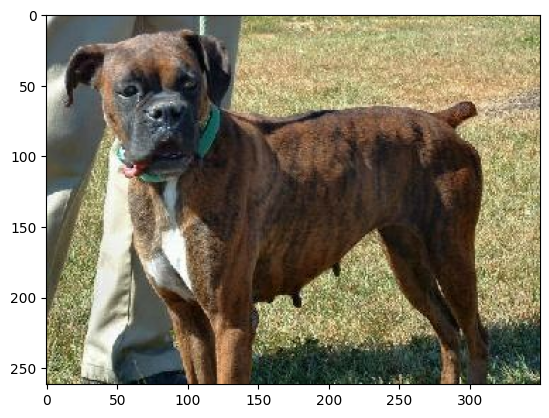

In [3]:
ds = tfds.load("cats_vs_dogs")

sample = next(iter(ds['train']))
image, label = sample['image'], sample['label']

print(image.shape)
print(label)
plt.imshow(image)
plt.show()

In [4]:
# Input Shape: (None, 224, 224, 3)

input_image = tf.keras.layers.Resizing(224, 224)(image)
input_image = tf.expand_dims(input_image, axis=0)
input_image = tf.keras.applications.vgg16.preprocess_input(input_image)

print(input_image.shape)

(1, 224, 224, 3)


### Visualization of Feature Maps

In [5]:
def get_all_layers_outputs(model, input_image):
  layers = model.layers[1:]
  visualization_model = tf.keras.models.Model(inputs=model.inputs,
                                              outputs=[layer.output for layer in layers])

  outputs = visualization_model.predict(input_image)
  return dict([(layers[i].name, outputs[i]) for i in range(len(layers))])

In [6]:
features = get_all_layers_outputs(model, input_image)

layer_names = list(features.keys())
print("Number of layers: ", len(layer_names))
print(layer_names)

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Number of layers:  22
['block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool', 'flatten', 'fc1', 'fc2', 'predictions']


In [7]:
SUBPLOT_DIMENSIONS_DICT = {3: (1, 3), 64: (8, 8), 128: (8, 16), 256: (16, 16), 512: (16, 32)}
FIG_SIZE_DICT = {3: (8, 8), 64: (8, 8), 128: (12, 12), 256: (12, 12), 512: (16, 16)}

def visualize_conv_features(layer_index):
  if layer_index == 0:
    layer_name = "input_layer"
    layer_features = input_image
  else:
    layer_name = layer_names[layer_index - 1]
    layer_features = features[layer_name]

  print(layer_name, ":", layer_features.shape)

  n_features = layer_features.shape[-1]
  figsize = FIG_SIZE_DICT[n_features]
  rows, columns = SUBPLOT_DIMENSIONS_DICT[n_features]

  plt.figure(figsize=figsize)
  idx = 1

  for i in range(rows):
    for j in range(columns):
      plt.subplot(rows, columns, idx)
      plt.imshow(layer_features[0, :, :, idx-1])
      plt.axis("off")
      idx += 1

  plt.show()

input_layer : (1, 224, 224, 3)


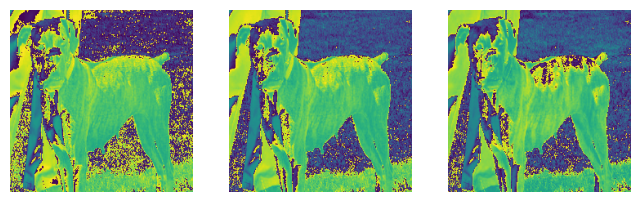

In [8]:
visualize_conv_features(0)

block1_conv1 : (1, 224, 224, 64)


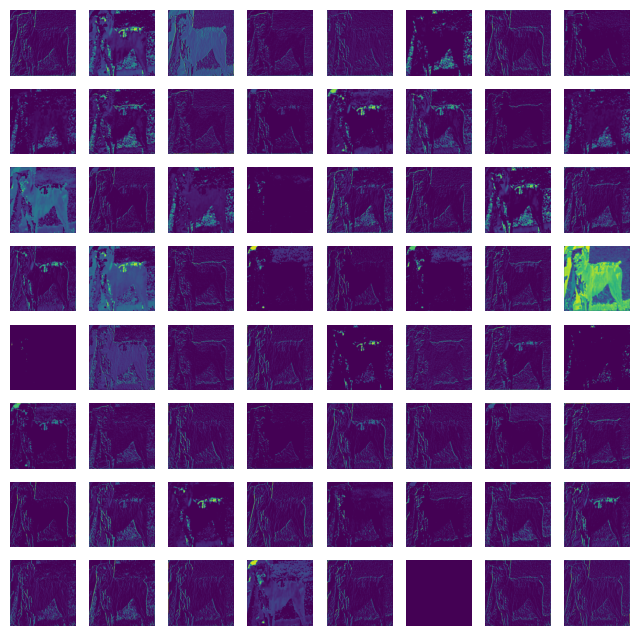

In [9]:
visualize_conv_features(1)

block1_conv2 : (1, 224, 224, 64)


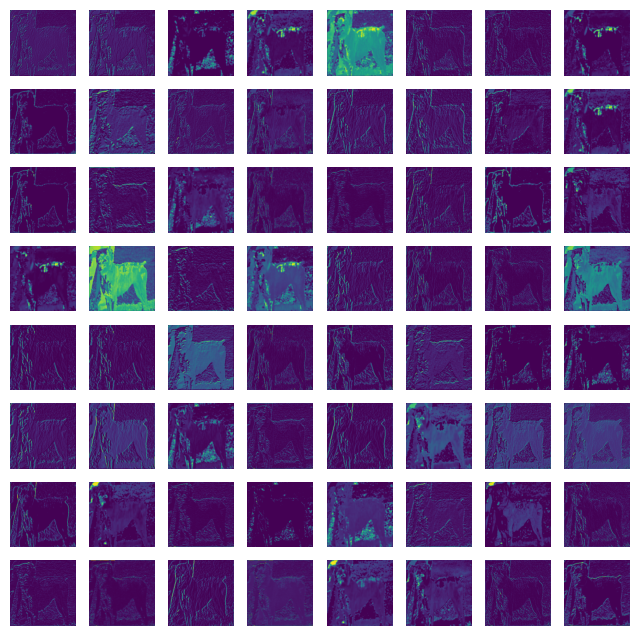

In [10]:
visualize_conv_features(2)

block1_pool : (1, 112, 112, 64)


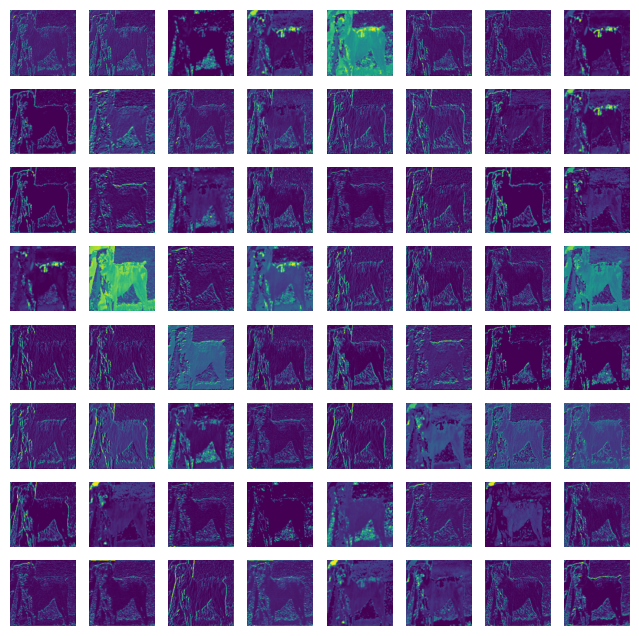

In [11]:
visualize_conv_features(3)

block2_conv1 : (1, 112, 112, 128)


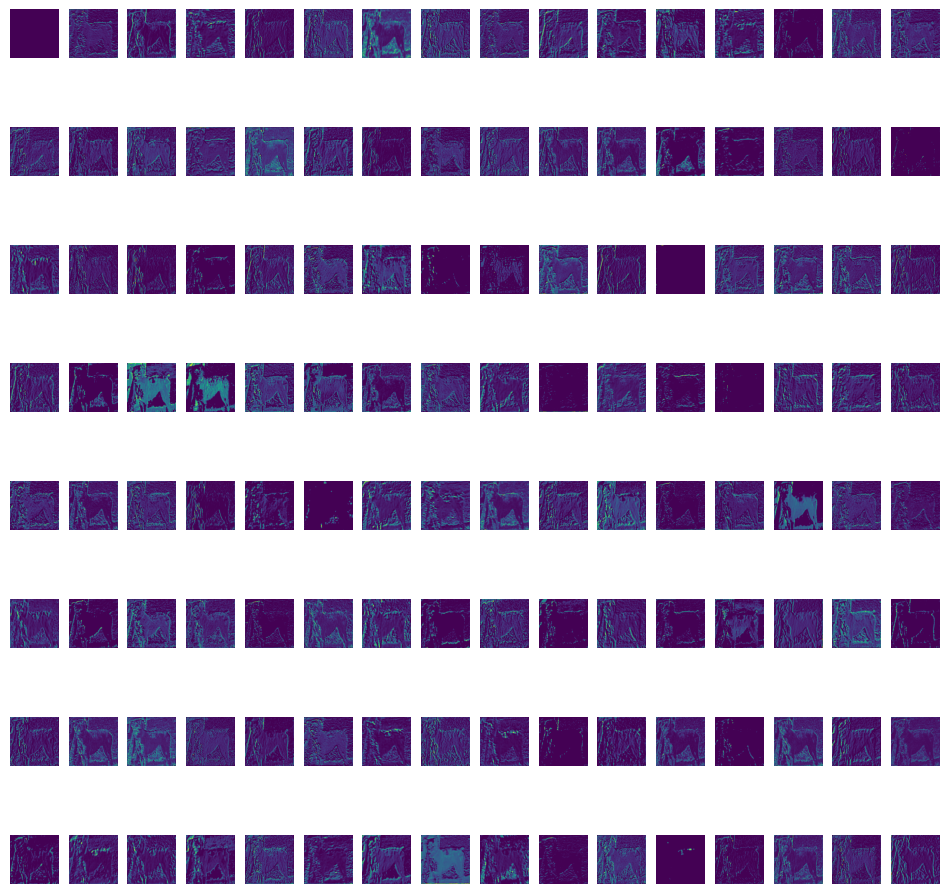

In [12]:
visualize_conv_features(4)

block2_conv2 : (1, 112, 112, 128)


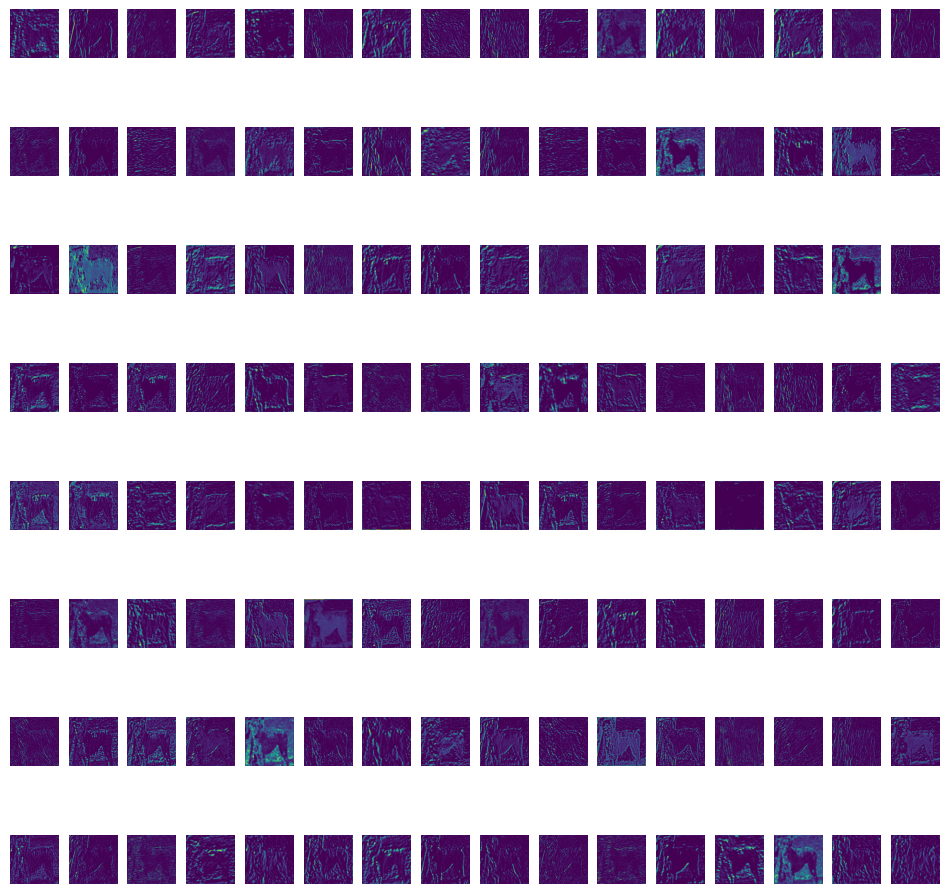

In [13]:
visualize_conv_features(5)

block2_pool : (1, 56, 56, 128)


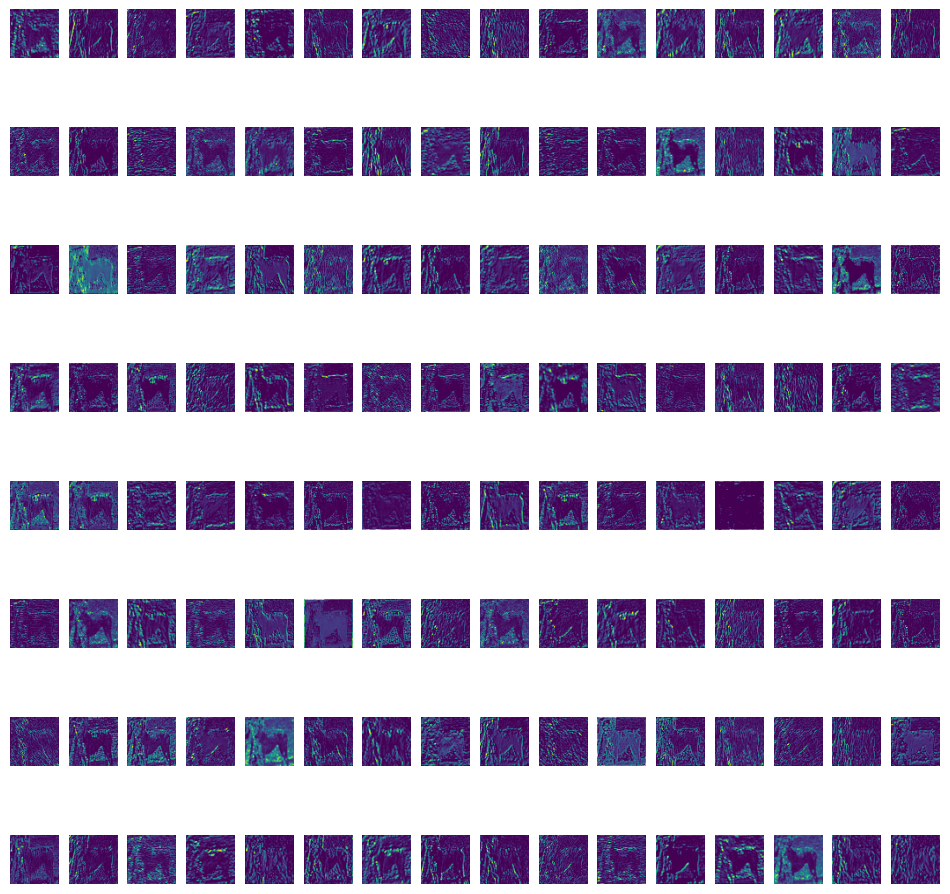

In [14]:
visualize_conv_features(6)

block3_conv1 : (1, 56, 56, 256)


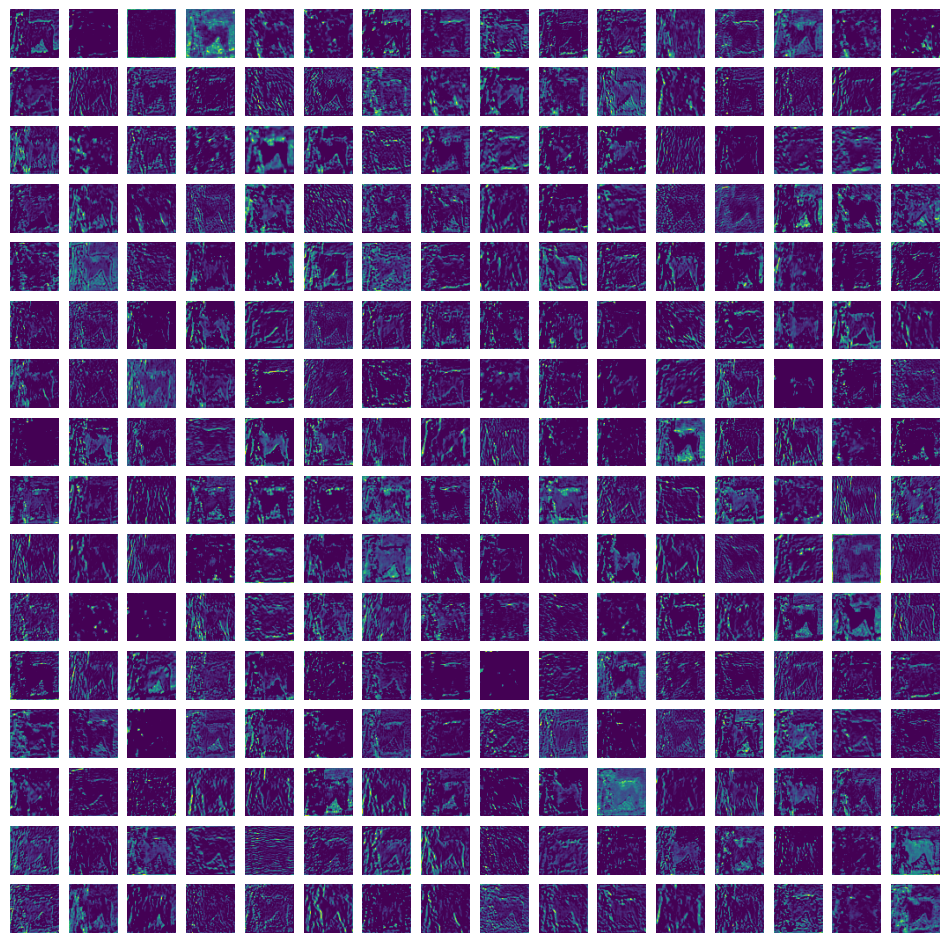

In [15]:
visualize_conv_features(7)

block3_conv2 : (1, 56, 56, 256)


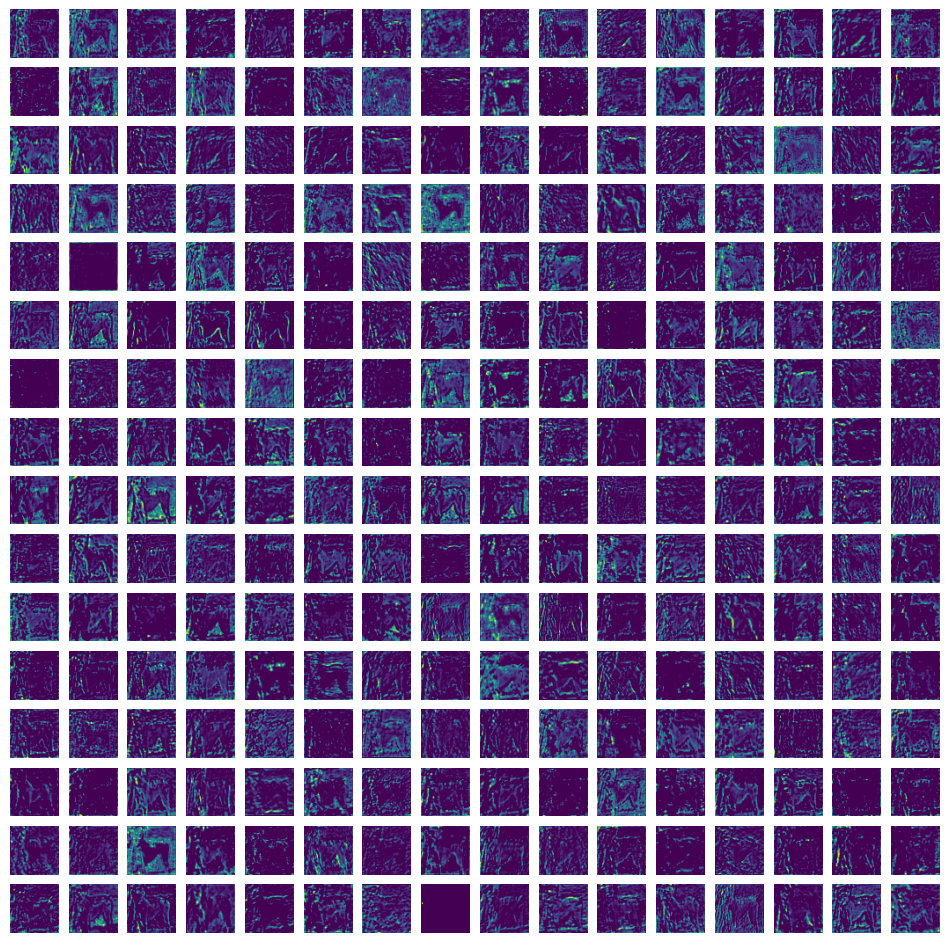

In [16]:
visualize_conv_features(8)

block3_conv3 : (1, 56, 56, 256)


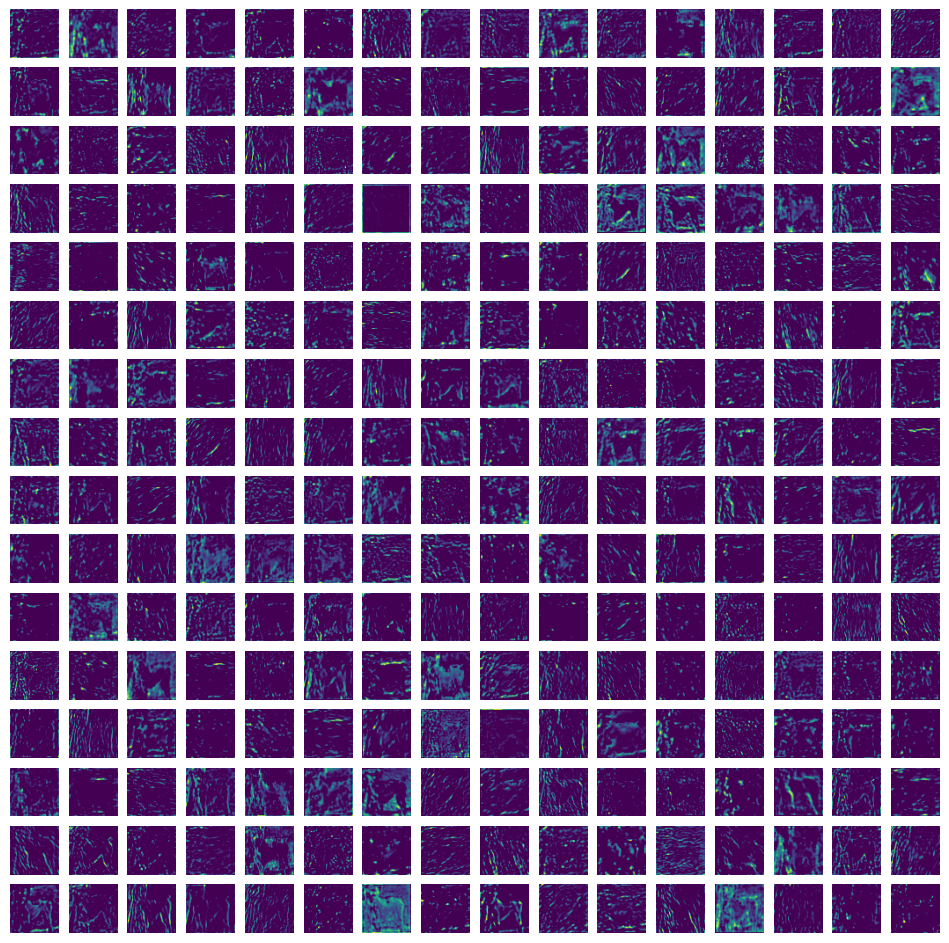

In [17]:
visualize_conv_features(9)

block3_pool : (1, 28, 28, 256)


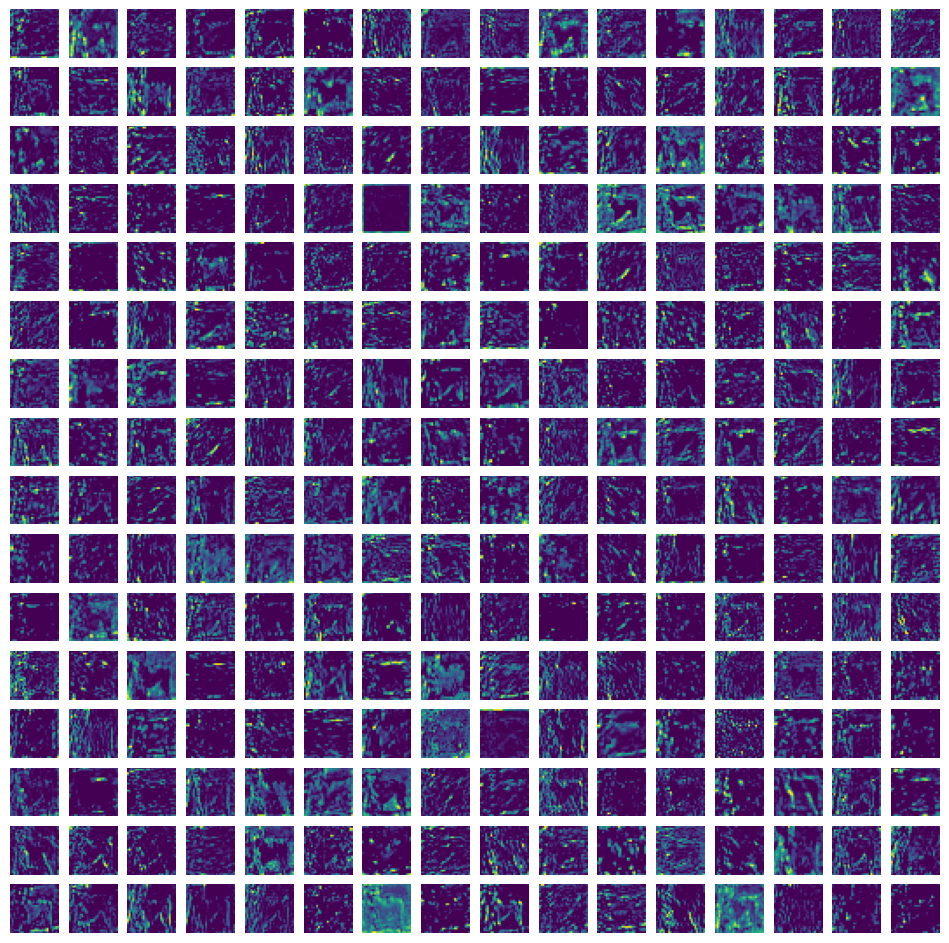

In [18]:
visualize_conv_features(10)

block4_conv1 : (1, 28, 28, 512)


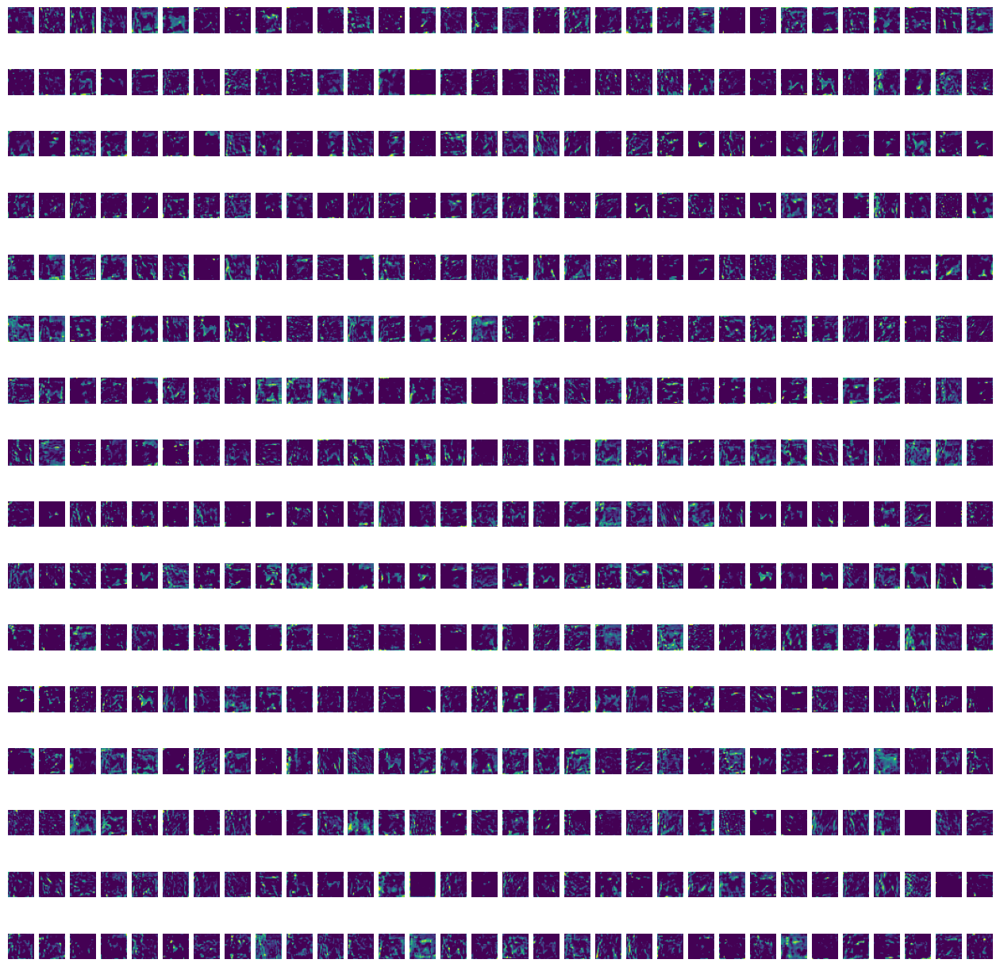

In [19]:
visualize_conv_features(11)

block4_conv2 : (1, 28, 28, 512)


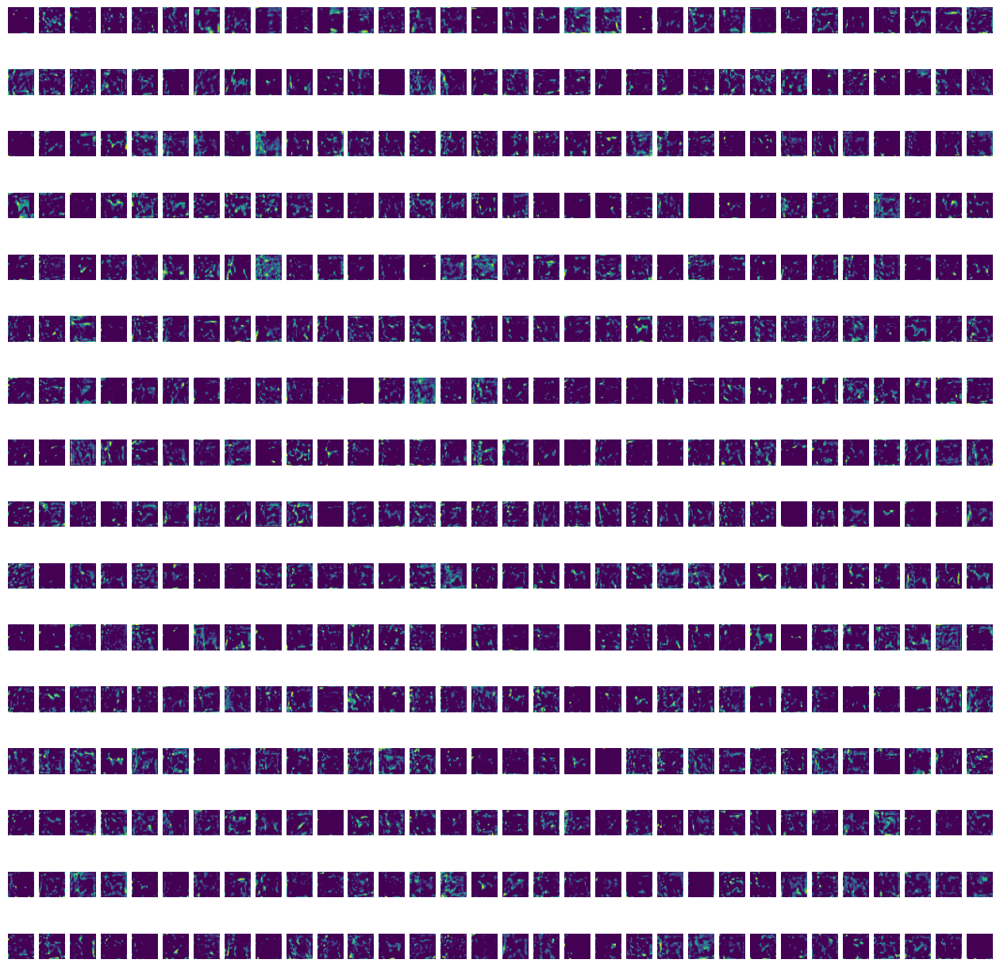

In [20]:
visualize_conv_features(12)

block4_conv3 : (1, 28, 28, 512)


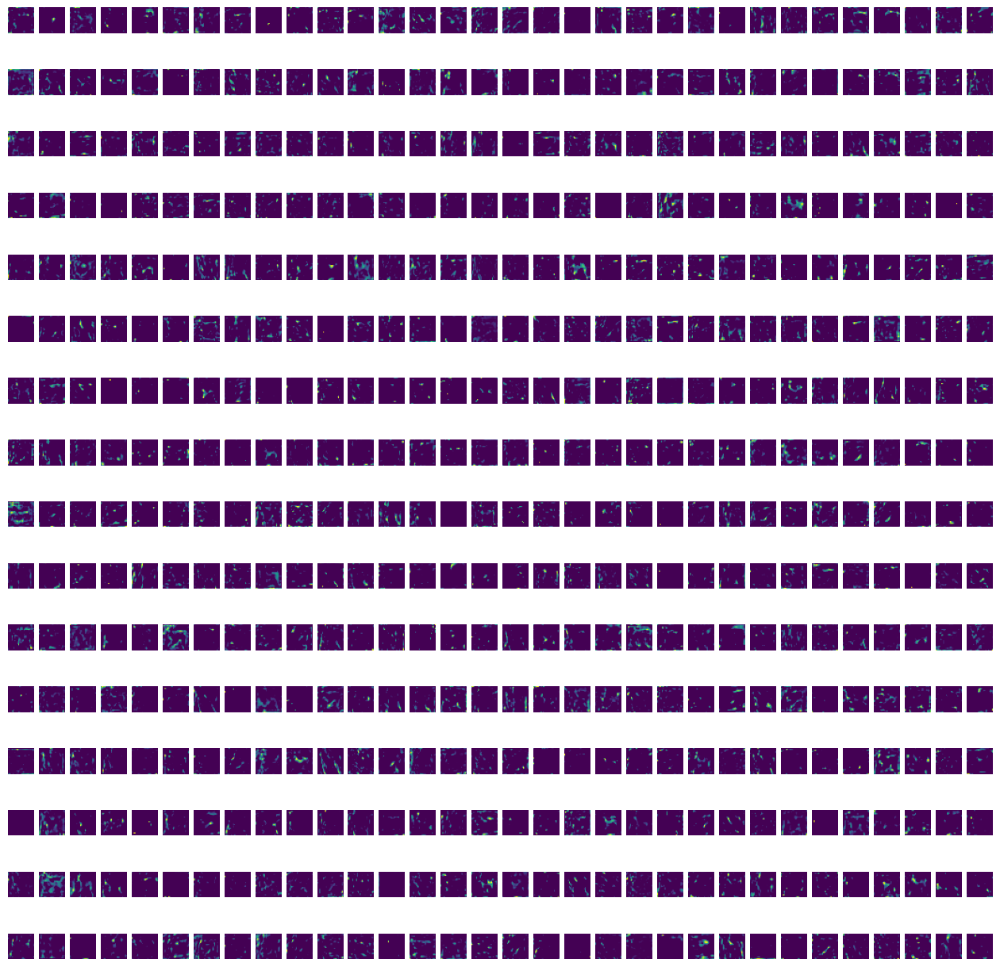

In [21]:
visualize_conv_features(13)

block4_pool : (1, 14, 14, 512)


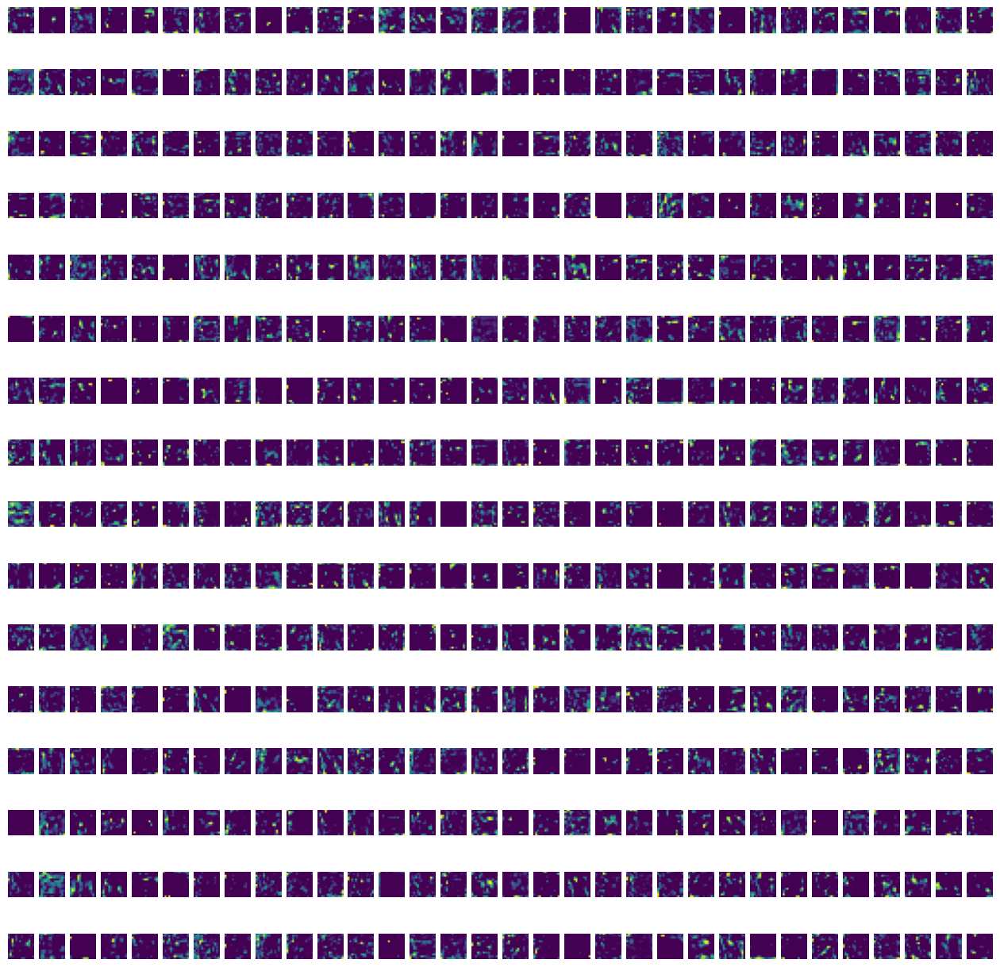

In [22]:
visualize_conv_features(14)

block5_conv1 : (1, 14, 14, 512)


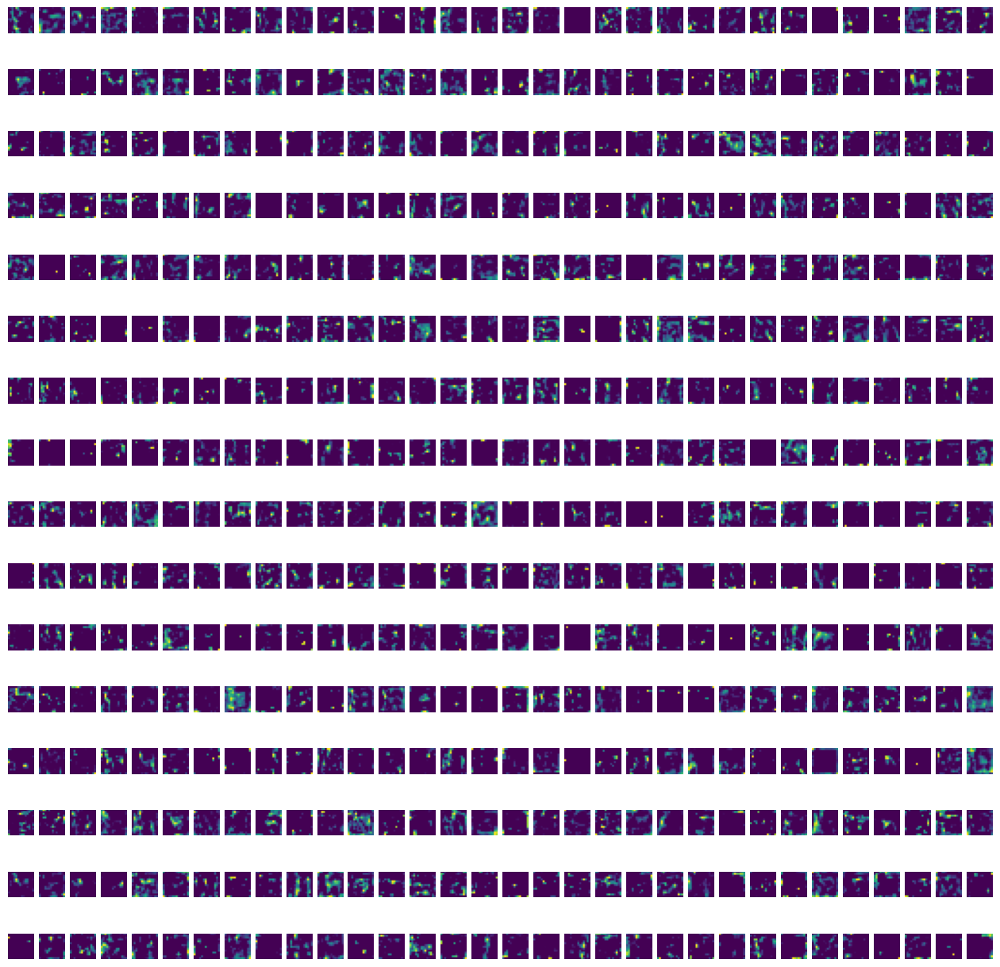

In [23]:
visualize_conv_features(15)

block5_conv2 : (1, 14, 14, 512)


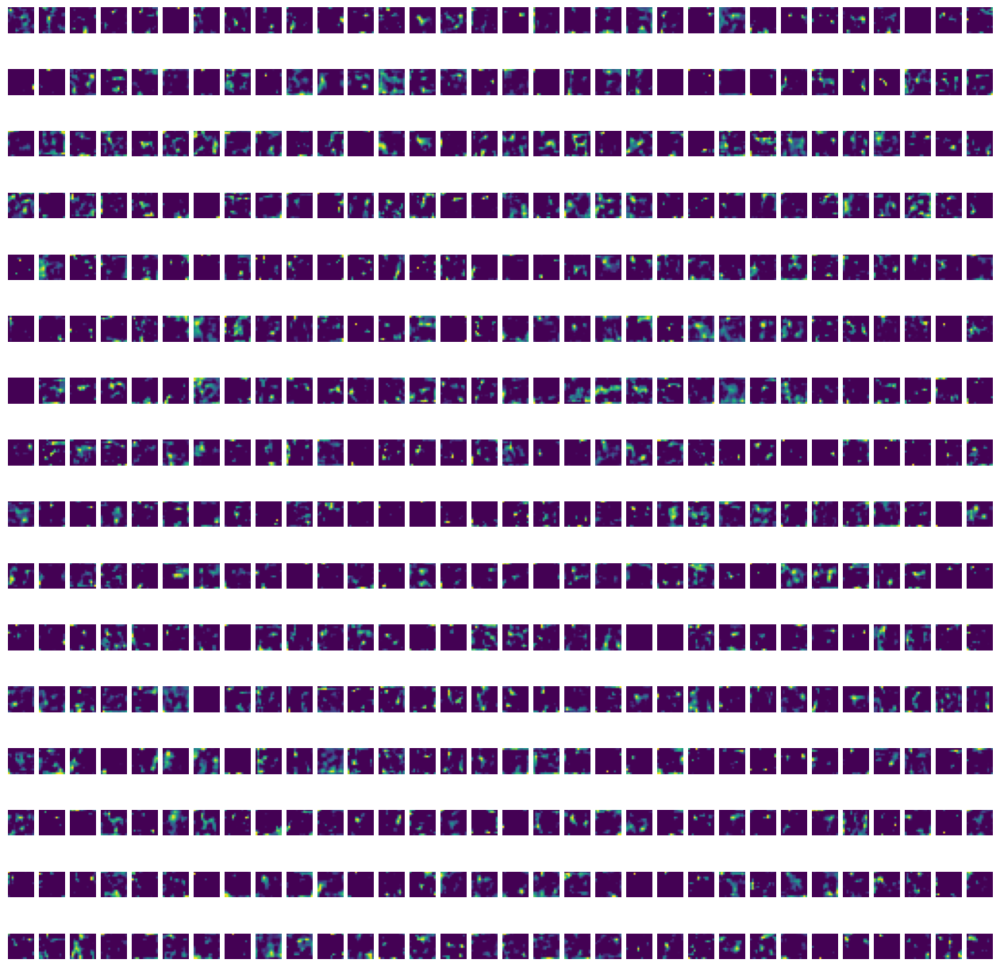

In [24]:
visualize_conv_features(16)

block5_conv3 : (1, 14, 14, 512)


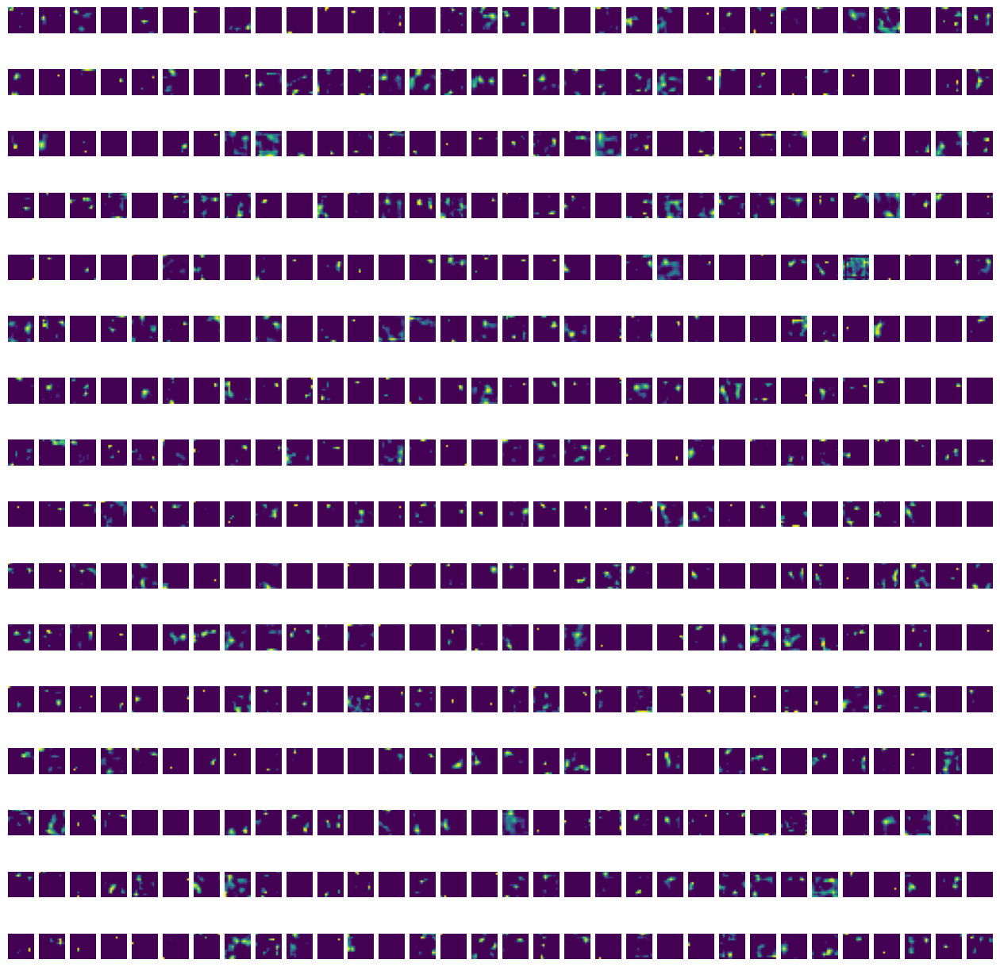

In [25]:
visualize_conv_features(17)

block5_pool : (1, 7, 7, 512)


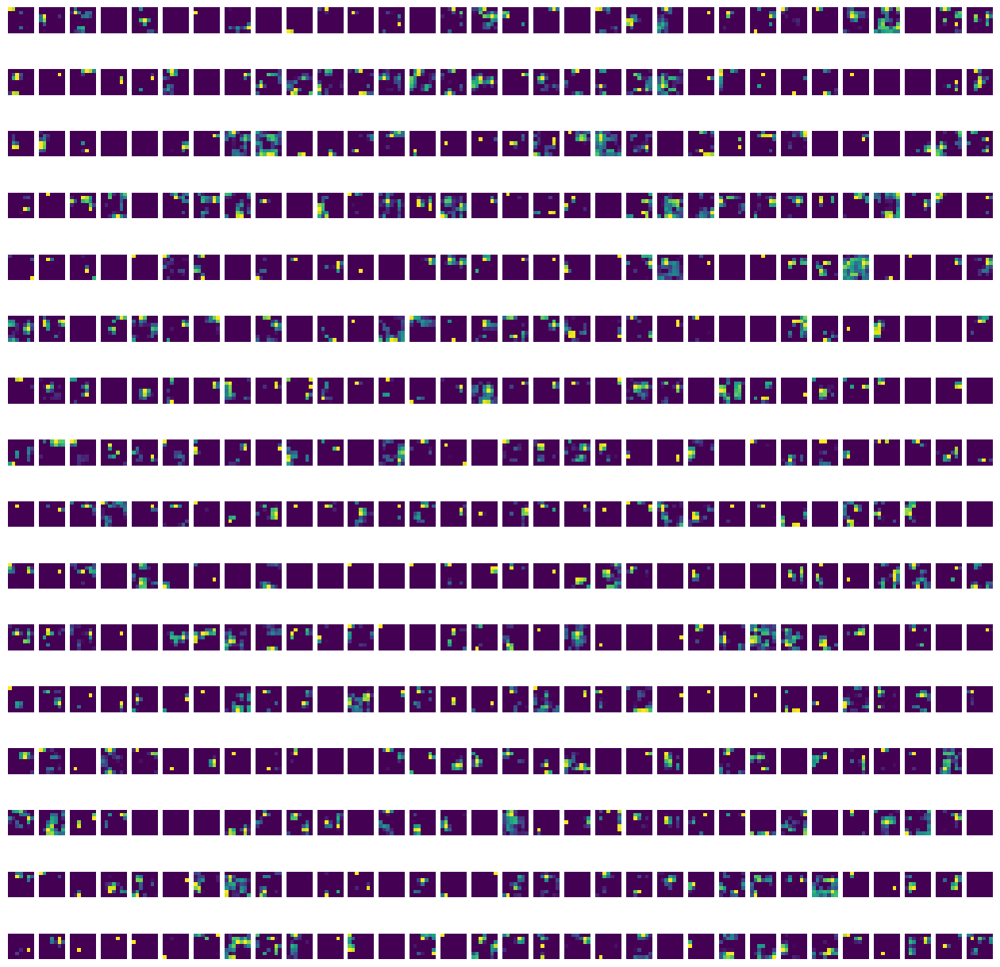

In [26]:
visualize_conv_features(18)